<a href="https://colab.research.google.com/github/yrodriguezmd/IceVision_miniprojects/blob/main/BCCD_Dataset__for_notebook_2021_9_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## About the BCCD_Dataset
The [BCCD_dataset](https://github.com/Shenggan/BCCD_Dataset) contains blood cells images. It is a VOC-reformatted version of the original dataset by [cosmicad](https://github.com/cosmicad/dataset) and by [akshaylambda](https://github.com/akshaylamba/all_CELL_data). It contains 364 images with 3 classes ('RBC', 'WBC', 'Platelets'). The RBC class is predominant by nature, thus is it  over-represented in the dataset.

### Installation and Imports

In [ ]:
!wget https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
!bash install_colab.sh

--2021-09-04 17:16:44--  https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1244 (1.2K) [text/plain]
Saving to: ‘install_colab.sh’

install_colab.sh    100%[===================>]   1.21K  --.-KB/s    in 0s      

2021-09-04 17:16:44 (67.5 MB/s) - ‘install_colab.sh’ saved [1244/1244]

Installing icevision + dependencices for CUDA 10
Uninstalling some dependencies to prevent errors
Found existing installation: torchvision 0.10.0+cu102
Uninstalling torchvision-0.10.0+cu102:
  Successfully uninstalled torchvision-0.10.0+cu102
Found existing installation: fastai 1.0.61
Uninstalling fastai-1.0.61:
  Successfully uninstalled fastai-1.0.61
Installing some dependencies to prevent errors
     |██

In [ ]:
from icevision.all import *

### Clone the BCCD dataset repository


In [15]:
!git clone https://github.com/Shenggan/BCCD_Dataset.git

Cloning into 'BCCD_Dataset'...
remote: Enumerating objects: 800, done.
remote: Total 800 (delta 0), reused 0 (delta 0), pack-reused 800
Receiving objects: 100% (800/800), 7.39 MiB | 12.50 MiB/s, done.
Resolving deltas: 100% (378/378), done.


### Set Directories

In [3]:
%pwd

'/content'

In [16]:
!ls

BCCD	      dataset	   export.py  plot.py	 scripts
BCCD_Dataset  example.jpg  LICENSE    README.md  test.csv


In [17]:
%cd BCCD_Dataset

/content/BCCD_Dataset/BCCD_Dataset


In [6]:
!ls

BCCD	 example.jpg  LICENSE  README.md  test.csv
dataset  export.py    plot.py  scripts


In [18]:
Path('/content/BCCD_Dataset/BCCD').ls()

(#3) [Path('/content/BCCD_Dataset/BCCD/Annotations'),Path('/content/BCCD_Dataset/BCCD/JPEGImages'),Path('/content/BCCD_Dataset/BCCD/ImageSets')]

In [19]:
data_dir = Path('/content/BCCD_Dataset/BCCD')

images_dir = data_dir/ 'JPEGImages'
annotations_dir = data_dir/'Annotations'

### Parser: Use icevision predefined VOC parser

The BCCD_Dataset revised VOC format is well-structured for parsing and modelling.  

If you prefer to practice in creating a subclass parser, use the original dataset from [cosmicad](https://github.com/cosmicad/dataset).

In [ ]:
# for subclass practice using original dataset!
#class BCCDParser(parsers.VOCBBoxParser):
#    def filepath(self, o) -> Union[str, Path]:
#        self._filename = self._root.find("filename").text + '.jpg'
#        return self.images_dir / self._filename

#### The VOCBBoxParser automatically arranges the images, labels and annotations, including autofixing of coordinates.  It splits the data to train and validation sets at 80/20 ratio by default.

In [20]:
parser = parsers.VOCBBoxParser(annotations_dir = annotations_dir,
                     images_dir = images_dir)

train_records, valid_records = parser.parse()

  0%|          | 0/364 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:136


  0%|          | 0/291 [00:00<?, ?it/s]

AUTOFIX-FAIL - (record_id: 304) - Cannot auto-fix coordinates: <BBox (xmin:181, ymin:329, xmax:181, ymax:329)>
	x_min:181 is greater than or equal to x_max:181
	y_min:329 is greater than or equal to y_max:329 | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-REPORT - (record_id: 304) Removed annotation with index: 3, for more info check the AUTOFIX-FAIL messages above | icevision.core.record:autofix:50
AUTOFIX-FAIL - (record_id: 299) - Cannot auto-fix coordinates: <BBox (xmin:504, ymin:337, xmax:504, ymax:337)>
	x_min:504 is greater than or equal to x_max:504
	y_min:337 is greater than or equal to y_max:337 | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-REPORT - (record_id: 299) Removed annotation with index: 12, for more info check the AUTOFIX-FAIL messages above | icevision.core.record:autofix:50


  0%|          | 0/73 [00:00<?, ?it/s]

In [10]:
parser.class_map

<ClassMap: {'background': 0, 'WBC': 1, 'RBC': 2, 'Platelets': 3}>

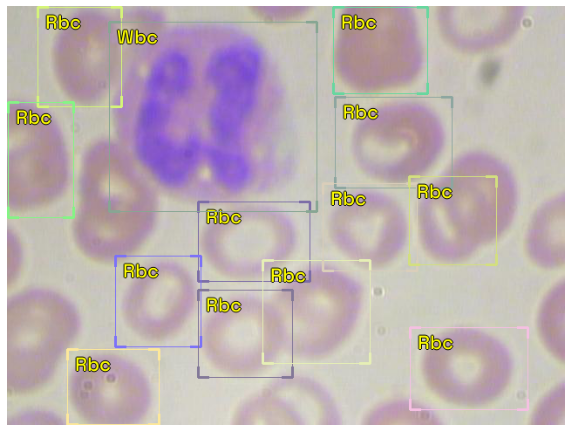

In [21]:
show_record(train_records[0], class_map=class_map, 
            figsize = (10,10),font_size=22, label_color = '#ffff00')

In [22]:
train_records[0]

BaseRecord

common: 
	- Image size ImgSize(width=640, height=480)
	- Filepath: /content/BCCD_Dataset/BCCD/JPEGImages/BloodImage_00400.jpg
	- Img: None
	- Record ID: 355
detection: 
	- Class Map: <ClassMap: {'background': 0, 'WBC': 1, 'RBC': 2, 'Platelets': 3}>
	- Labels: [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1]
	- BBoxes: [<BBox (xmin:462, ymin:368, xmax:597, ymax:462)>, <BBox (xmin:376, ymin:104, xmax:510, ymax:208)>, <BBox (xmin:219, ymin:224, xmax:347, ymax:315)>, <BBox (xmin:124, ymin:286, xmax:222, ymax:390)>, <BBox (xmin:69, ymin:393, xmax:174, ymax:479)>, <BBox (xmin:219, ymin:325, xmax:327, ymax:425)>, <BBox (xmin:293, ymin:291, xmax:416, ymax:409)>, <BBox (xmin:362, ymin:203, xmax:470, ymax:303)>, <BBox (xmin:35, ymin:1, xmax:131, ymax:115)>, <BBox (xmin:461, ymin:195, xmax:561, ymax:296)>, <BBox (xmin:374, ymin:1, xmax:482, ymax:100)>, <BBox (xmin:1, ymin:110, xmax:76, ymax:242)>, <BBox (xmin:117, ymin:18, xmax:355, ymax:235)>]

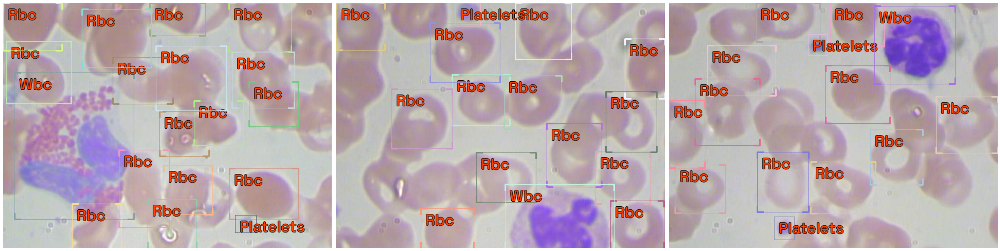

In [23]:
show_records(train_records[1:4], ncols=3, class_map=class_map,
                          font_size=30, label_color = '#ff4000')

### Transforms

In [24]:
presize = 512
size = 384

train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=size, presize=presize), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size=size), tfms.A.Normalize()])

In [25]:
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

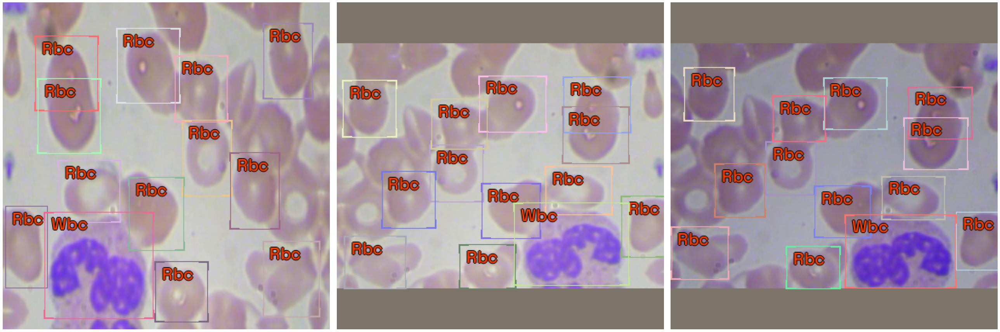

In [27]:
samples = [train_ds[6] for _ in range(3)]
show_samples(samples, class_map=class_map, denormalize_fn=denormalize_imagenet, ncols=3,
                                       font_size=20, label_color = '#ff4000')

### Model

In [36]:
selection = 0

extra_args = {}

if selection == 0:
  model_type = models.mmdet.retinanet
  backbone = model_type.backbones.resnet50_fpn_1x

elif selection == 1:
  # The Retinanet model is also implemented in the torchvision library
  model_type = models.torchvision.retinanet
  backbone = model_type.backbones.resnet50_fpn

elif selection == 2:
  model_type = models.ross.efficientdet
  backbone = model_type.backbones.tf_lite0
  # The efficientdet model requires an img_size parameter
  extra_args['img_size'] = image_size

elif selection == 3:
  model_type = models.ultralytics.yolov5
  backbone = model_type.backbones.small
  # The yolov5 model requires an img_size parameter
  extra_args['img_size'] = image_size

In [37]:
# Instantiate the mdoel
model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(parser.class_map), **extra_args)

/usr/local/lib/python3.7/dist-packages/mmcv/cnn/utils/weight_init.py:119: UserWarning: init_cfg without layer key, if you do not define override key either, this init_cfg will do nothing
  'init_cfg without layer key, if you do not define override'


Use load_from_local loader
The model and loaded state dict do not match exactly

size mismatch for bbox_head.retina_cls.weight: copying a param with shape torch.Size([720, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([27, 256, 3, 3]).
size mismatch for bbox_head.retina_cls.bias: copying a param with shape torch.Size([720]) from checkpoint, the shape in current model is torch.Size([27]).


In [38]:
# Data Loaders
train_dl = model_type.train_dl(train_ds, batch_size=8, num_workers=4, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=8, num_workers=4, shuffle=False)

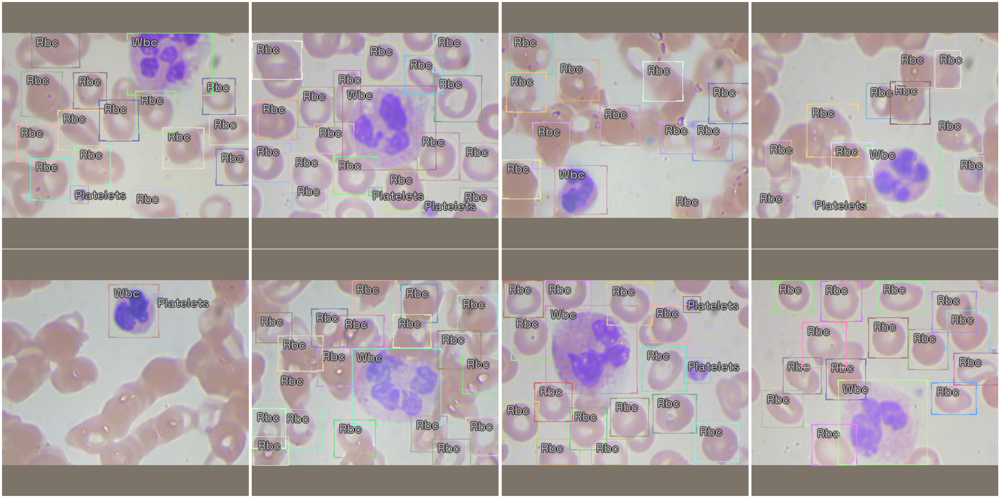

In [31]:
model_type.show_batch(first(valid_dl), ncols=4)

### Training

SuggestedLRs(lr_min=0.00010000000474974513, lr_steep=7.585775892948732e-05)

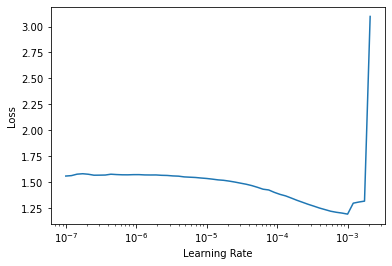

In [39]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)

learn.lr_find()

In [40]:
from fastai.callback.tracker import SaveModelCallback
fname='bccd-faster-rcnn-best'
learn.fine_tune(30, 1e-4, freeze_epochs=1, cbs=SaveModelCallback(monitor='COCOMetric', fname=fname))

epoch,train_loss,valid_loss,COCOMetric,time
0,1.115278,0.641153,0.122198,00:18


Better model found at epoch 0 with COCOMetric value: 0.12219780180042354.


epoch,train_loss,valid_loss,COCOMetric,time
0,0.572847,0.538687,0.172560,00:20
1,0.540202,0.493718,0.305607,00:19
2,0.508126,0.456729,0.384957,00:20
3,0.480254,0.453184,0.383198,00:19
4,0.456199,0.407930,0.489054,00:20
5,0.435621,0.397556,0.516582,00:19
6,0.418572,0.406749,0.515558,00:20
7,0.405568,0.369366,0.545732,00:20
8,0.400645,0.374409,0.531463,00:20
9,0.393593,0.368677,0.544195,00:20


Better model found at epoch 0 with COCOMetric value: 0.1725602817284627.
Better model found at epoch 1 with COCOMetric value: 0.3056067224633808.
Better model found at epoch 2 with COCOMetric value: 0.38495665778440413.
Better model found at epoch 4 with COCOMetric value: 0.48905390999352866.
Better model found at epoch 5 with COCOMetric value: 0.5165816969516888.
Better model found at epoch 7 with COCOMetric value: 0.5457318240580205.
Better model found at epoch 10 with COCOMetric value: 0.5479309175610552.
Better model found at epoch 14 with COCOMetric value: 0.5496355572699346.
Better model found at epoch 15 with COCOMetric value: 0.5564064645417198.
Better model found at epoch 19 with COCOMetric value: 0.5674139573939448.
Better model found at epoch 23 with COCOMetric value: 0.5721516911171818.


### Show results

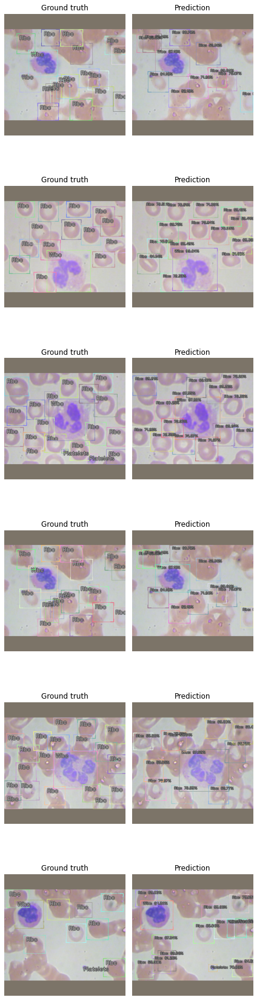

In [41]:
model_type.show_results(model, valid_ds) 

### Saving the Model on Google Drive

Create a folder named 'models' in GDrive prior to running the following codes.

In [42]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True) # sign-in
root_dir = Path('/content/gdrive/My Drive/')

Mounted at /content/gdrive


#### Saving the last model

In [43]:
torch.save(model.state_dict(), root_dir/'models/bccd-faster-rcnn.pth')

#### Saving the best model

In [44]:
!ls models

bccd-faster-rcnn-best.pth


In [45]:
!cp models/bccd-faster-rcnn-best.pth /content/gdrive/"My Drive"/models/bccd-faster-rcnn-best.pth

## Happy Learning!

If you need any assistance, feel free to join our [forum](https://discord.gg/JDBeZYK).